In [2]:
import numpy as np
import pandas as pd

In [3]:
#infile=r'C:\Users\sreddy\OneDrive - MerckGroup\New folder\process_logs\application_1584006084041_0213.csv'
outfile=r'C:\Users\sreddy\OneDrive - MerckGroup\New folder\process_logs\1application_1568810042014_190726_processed.csv'
header_list = ["level", "message", "lable"]
df=pd.read_csv(outfile,delimiter="|",names=header_list)
df.shape

(293, 3)

In [4]:
df.describe()

,level,message,lable
count,293,293,293
unique,3,94,2
top,info,securitymanager securitymanager authentication...,success
freq,283,12,291


In [5]:
df1=df.drop_duplicates(subset={"level","message","lable"}, keep='first', inplace=False)
df1.shape

(94, 3)

In [6]:
df1['message'].values

array(['coarsegrainedexecutorbackend registered signal handlers for [term, hup, int]',
       'securitymanager changing view acls to ',
       'securitymanager changing modify acls to ',
       'securitymanager securitymanager authentication disabled ui acls disabled users with view permissions set() users with modify permissions set()',
       'slfjlogger slfjlogger started', 'remoting starting remoting',
       'remoting remoting started listening on addresses [tcpcom]',
       "utils successfully started service 'sparkexecutoractorsystem' on port ",
       'diskblockmanager created local directory at info',
       'coarsegrainedexecutorbackend connecting to driver spark',
       'coarsegrainedexecutorbackend successfully registered with driver',
       'executor starting executor id  on host com',
       "utils successfully started service 'nettyblocktransferservice' on port ",
       'nettyblocktransferservice server created on ',
       'blockmanagermaster trying to register block

In [7]:
#infile=r'C:\Users\sreddy\OneDrive - MerckGroup\New folder\process_logs\application_1584006084041_0213.csv'
outfile=r'C:\Users\sreddy\OneDrive - MerckGroup\New folder\process_logs\1application_1568810042014_190734_processed.csv'
header_list = ["level", "message", "lable"]
df_test=pd.read_csv(outfile,delimiter="|",names=header_list)
df_test.shape

(329, 3)

In [8]:
df_test.head(5)

,level,message,lable
0,info,coarsegrainedexecutorbackend registered signal...,success
1,info,securitymanager changing view acls to,success
2,info,securitymanager changing modify acls to,success
3,info,securitymanager securitymanager authentication...,success
4,info,securitymanager changing view acls to,success


In [9]:
df_test1=df_test.drop_duplicates(subset={"level","message","lable"}, keep='first', inplace=False)
df_test1.shape

(101, 3)

#### N-gram

In [19]:
processedfile=r'C:\Users\sreddy\OneDrive - MerckGroup\New folder\process_logs\1application_1568810042014_190726_processed.csv'
header_list = ["level", "message", "lable"]
df=pd.read_csv(processedfile,delimiter="|",names=header_list)
df.shape

#message_one_hot = vectorizer.fit(df1['message'].values)
#message_one_hot = vectorizer.transform(df1['message'].values)
#message_one_hot.toarray()
#message_one_hot

(293, 3)

In [21]:
nodupdf=df.drop_duplicates(subset={"level","message","lable"}, keep='first', inplace=False)
nodupdf.shape
errordf=nodupdf[nodupdf['level']=='error']
nodupErrorDf=errordf.drop_duplicates(subset={"message"}, keep='first', inplace=False)
nodupErrorDf

,level,message,lable
101,error,applicationmaster user class threw exception i...,numberformatexception


In [23]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(ngram_range=(3,10))
error_vector = vectorizer.fit_transform(nodupErrorDf['message'].values)

In [24]:
recomDbfile=r'C:\Users\sreddy\OneDrive - MerckGroup\New folder\process_logs\rdb.csv'
header_list = ["message", "solution"]
rdbDF=pd.read_csv(recomDbfile,delimiter="|",names=header_list)
rdbDF.shape

(9, 2)

In [25]:
rdbMessage_vector = vectorizer.fit_transform(rdbDF['message'])

In [30]:
import numpy as np
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity

results=[]
#q_vector = vectorizer.transform([error_vector.iloc[0]["message"]])
results.append(cosine_similarity(error_vector, rdbMessage_vector.toarray()))
results

ValueError: Incompatible dimension for X and Y matrices: X.shape[1] == 52 while Y.shape[1] == 362

In [39]:
#dir(error_vector)
#error_vector.shape
error_vector.data

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

In [11]:
#TEST

from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(ngram_range=(3,10))
message_one_hot = vectorizer.fit(df_test1['message'].values)
message_one_hot = vectorizer.transform(df_test1['message'].values)
message_one_hot.toarray()
message_one_hot

<101x4660 sparse matrix of type '<class 'numpy.int64'>'
	with 6216 stored elements in Compressed Sparse Row format>

#### BOW

In [12]:
vectorizer = CountVectorizer(min_df=5,ngram_range=(3,6), max_features=5000)
vectorizer.fit(df1['message'].values)
message_bow_train = vectorizer.transform(df1['message'].values)

In [13]:
level_one_hot=pd.get_dummies(df1['level'].values)
level_one_hot.head(5)

,error,info,warn
0,0,1,0
1,0,1,0
2,0,1,0
3,0,1,0
4,0,1,0


In [14]:
#TEST
vectorizer = CountVectorizer(min_df=5,ngram_range=(3,6), max_features=5000)
vectorizer.fit(df_test1['message'].values)
message_bow_test = vectorizer.transform(df_test1['message'].values)

In [15]:
level_one_hot_test=pd.get_dummies(df_test1['level'].values)
level_one_hot_test.head(5)

,error,info,warn
0,0,1,0
1,0,1,0
2,0,1,0
3,0,1,0
4,0,1,0


In [147]:
from scipy.sparse import hstack
X_test = hstack((level_one_hot_test,message_bow_test))
X_test.shape

(101, 6)

In [148]:
from scipy.sparse import hstack
X = hstack((level_one_hot,message_bow_train))
X.shape

(95, 6)

In [157]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
Y=encoder.fit_transform(df1['lable'])
encoder.classes_


array(['numberformatexception', 'success'], dtype=object)

In [162]:
from sklearn.model_selection import GridSearchCV
from sklearn import tree
param_grid = {"max_depth": [1, 5, 10, 50,100] }
gs = GridSearchCV
gs = GridSearchCV(tree.DecisionTreeClassifier(class_weight = 'balanced'),param_grid=param_grid,cv=2,scoring='roc_auc',verbose=3)
grid_search = gs.fit(X, Y)

Fitting 2 folds for each of 5 candidates, totalling 10 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] max_depth=1 .....................................................
[CV] ......................... max_depth=1, score=1.000, total=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV] max_depth=1 .....................................................
[CV] ......................... max_depth=1, score=1.000, total=   0.0s


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV] max_depth=5 .....................................................
[CV] ......................... max_depth=5, score=1.000, total=   0.0s
[CV] max_depth=5 .....................................................
[CV] ......................... max_depth=5, score=1.000, total=   0.0s
[CV] max_depth=10 ....................................................
[CV] ........................ max_depth=10, score=1.000, total=   0.0s
[CV] max_depth=10 ....................................................
[CV] ........................ max_depth=10, score=1.000, total=   0.0s
[CV] max_depth=50 ....................................................
[CV] ........................ max_depth=50, score=1.000, total=   0.0s
[CV] max_depth=50 ....................................................
[CV] ........................ max_depth=50, score=1.000, total=   0.0s
[CV] max_depth=100 ...................................................
[CV] ....................... max_depth=100, score=1.000, total=   0.0s
[CV] m

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.0s finished


In [159]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
Y_test=encoder.fit_transform(df_test1['lable'])
encoder.classes_

array(['numberformatexception', 'success'], dtype=object)

In [160]:
import time
from sklearn import tree
clf = tree.DecisionTreeClassifier()
clf.fit(X,Y)

y_base_pred = clf.predict(X_test)

In [161]:
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(Y_test, y_base_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

1.0

In [173]:
result.head(5)

,predicted,Actual
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1


In [165]:
grid_search.cv_results_

{'mean_fit_time': array([0.00199437, 0.00198555, 0.00249076, 0.0023253 , 0.00199437]),
 'std_fit_time': array([7.15255737e-07, 7.15255737e-06, 4.96149063e-04, 3.34978104e-04,
        4.76837158e-07]),
 'mean_score_time': array([0.00188696, 0.00206351, 0.00104666, 0.00107324, 0.00200903]),
 'std_score_time': array([1.10566616e-03, 6.93798065e-05, 4.76837158e-05, 7.59363174e-05,
        1.58548355e-05]),
 'param_max_depth': masked_array(data=[1, 5, 10, 50, 100],
              mask=[False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'max_depth': 1},
  {'max_depth': 5},
  {'max_depth': 10},
  {'max_depth': 50},
  {'max_depth': 100}],
 'split0_test_score': array([1., 1., 1., 1., 1.]),
 'split1_test_score': array([1., 1., 1., 1., 1.]),
 'mean_test_score': array([1., 1., 1., 1., 1.]),
 'std_test_score': array([0., 0., 0., 0., 0.]),
 'rank_test_score': array([1, 1, 1, 1, 1])}

### New Method

In [154]:
import numpy as np
import pandas as pd

outfile=r'C:\Users\sreddy\OneDrive - MerckGroup\New folder\process_logs\1application_1568810042014_190726_processed.csv'
header_list = ["level", "message", "lable"]
df=pd.read_csv(outfile,delimiter="|",names=header_list)

df1=df.drop_duplicates(subset={"level","message","lable"}, keep='first', inplace=False)
df1.shape

(94, 3)

### Word Embadding Example

In [155]:
from __future__ import absolute_import, division, print_function
import pandas as pd
# load the data into panda dataframe
data_file_name = r"C:\installed\compressed_Health_and_Personal_Care_5\Health_and_Personal_Care_5.json"
raw_df = pd.read_json(data_file_name, lines=True)
print("Data loaded")

Data loaded


In [156]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 346355 entries, 0 to 346354
Data columns (total 9 columns):
asin              346355 non-null object
helpful           346355 non-null object
overall           346355 non-null int64
reviewText        346355 non-null object
reviewTime        346355 non-null object
reviewerID        346355 non-null object
reviewerName      343304 non-null object
summary           346355 non-null object
unixReviewTime    346355 non-null int64
dtypes: int64(2), object(7)
memory usage: 23.8+ MB


In [157]:
raw_df.unixReviewTime.head(5)

0    1294185600
1    1329523200
2    1275955200
3    1202428800
4    1313452800
Name: unixReviewTime, dtype: int64

In [158]:
# Convert all the review text into a long string and print its length
raw_corpus = u''.join(raw_df['reviewText']+" ")
print("Raw Corpus contains {0:,} characters".format(len(raw_corpus)))

Raw Corpus contains 178,581,273 characters


In [159]:
# import natural language toolkit
import nltk
# download the punkt tokenizer
nltk.download('punkt')
print("The punkt tokenizer is downloaded")

The punkt tokenizer is downloaded


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\sreddy\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [160]:
# Load the punkt tokenizer
tokenizer = nltk.data.load("tokenizers/punkt/english.pickle")
print("The punkt tokenizer is loaded")
# we tokenize the raw string into raw sentences
raw_sentences = tokenizer.tokenize(raw_corpus)
print("We have {0:,} raw sentences".format(len(raw_sentences)))

The punkt tokenizer is loaded
We have 1,824,643 raw sentences


In [161]:
import re
# Clean and split sentence into words
def clean_and_split_str(string):
    strip_special_chars = re.compile("[^A-Za-z]+")
    string = re.sub(strip_special_chars, " ", string)
    return string.strip().split()

In [162]:
# clean each raw sentences and build the list of sentences
sentences = []
for raw_sent in raw_sentences:
    if len(raw_sent) > 0:
        sentences.append(clean_and_split_str(raw_sent))
print("We have {0:,} clean sentences".format(len(sentences)))

We have 1,824,643 clean sentences


In [163]:
print(raw_sentences[30])
print()
print(sentences[30])

I use this magnifier to inspect seeds and leaves.

['I', 'use', 'this', 'magnifier', 'to', 'inspect', 'seeds', 'and', 'leaves']


In [164]:
token_count = sum([len(sentence) for sentence in sentences])
print("The dataset corpus contains {0:,} tokens".format(token_count))

The dataset corpus contains 33,476,197 tokens


In [165]:
import multiprocessing

#Dimensionality of the resulting word vectors
num_features = 300

#Minimum word count threshold
min_word_count = 3

#Number of threads to run in parallel
num_workers = multiprocessing.cpu_count()

#Context window length
context_size = 7

#Seed for the RNG, to make the result reproducible
seed = 1

In [166]:

import gensim

word2vec_model = gensim.models.word2vec.Word2Vec(
    sg=0,
    seed=seed,
    workers=num_workers, 
    size=num_features, 
    min_count=min_word_count, 
    window=context_size)

In [167]:
word2vec_model.build_vocab(sentences=sentences)
print("The vocabulary is built")
#print("Word2Vec vocabulary length: ", len(word2vec_model.vector_size))
word2vec_model.vector_size



The vocabulary is built


300

In [168]:
dir(word2vec_model)

['__class__',
 '__contains__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__slotnames__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_adapt_by_suffix',
 '_check_input_data_sanity',
 '_check_training_sanity',
 '_clear_post_train',
 '_do_train_epoch',
 '_do_train_job',
 '_get_job_params',
 '_get_thread_working_mem',
 '_job_producer',
 '_load_specials',
 '_log_epoch_end',
 '_log_epoch_progress',
 '_log_progress',
 '_log_train_end',
 '_minimize_model',
 '_raw_word_count',
 '_save_specials',
 '_set_train_params',
 '_smart_save',
 '_train_epoch',
 '_train_epoch_corpusfile',
 '_update_job_params',
 '_worker_loop',
 '_worker_loop_corpusfile',
 'accuracy',
 'alpha',
 'batch_words',
 'build_vocab',
 'build_voca

In [169]:
#Start training the model
word2vec_model.train(sentences=sentences)
print("Training finished")

ValueError: You must specify either total_examples or total_words, for proper job parameters updationand progress calculations. The usual value is total_examples=model.corpus_count.

In [170]:
word2vec_model.save(r"C:\installed\compressed_Health_and_Personal_Care_5\word2vec_model_trained_on_Health_and_Personal_Care_5_23_08_2020.w2v")
print("Model saved")

Model saved


In [173]:
word2vec_model.wv.most_similar("quickly")

[('poofs', 0.2640202045440674),
 ('recede', 0.20612461864948273),
 ('Soo', 0.2053188532590866),
 ('Rock', 0.20496445894241333),
 ('Zep', 0.2049318104982376),
 ('imprinted', 0.2031269669532776),
 ('shorted', 0.20049530267715454),
 ('L', 0.19912853837013245),
 ('EXCELLENTLY', 0.1989223062992096),
 ('biomass', 0.1981809139251709)]

C:\installed\anaconda\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


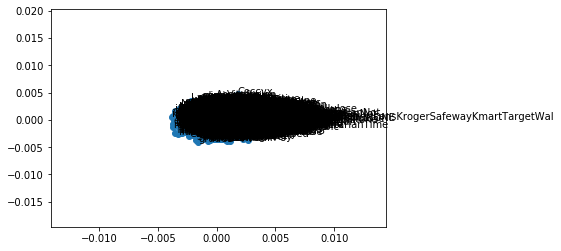

NameError: name 'plt' is not defined

In [57]:
X1 = word2vec_model[word2vec_model.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X1)
# create a scatter plot of the projection
pyplot.scatter(result[:, 0], result[:, 1])

words = list(word2vec_model.wv.vocab)
for i, word in enumerate(words):
    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()
plt.figure(figsize=(20,10))

In [80]:
X1 = word2vec_model[word2vec_model.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X1)

import plotly.express as px
fig = px.scatter(x=result[:, 0], y=result[:, 1])
fig.show()

fig = px.scatter(df, x="sepal_width", y="sepal_length", color="species",
                 size='petal_length', hover_data=['petal_width'])
fig.show()


# create a scatter plot of the projection
#pyplot.scatter(result[:, 0], result[:, 1])

#words = list(word2vec_model.wv.vocab)
#for i, word in enumerate(words):
#    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
#pyplot.show()
#plt.figure(figsize=(20,10))

C:\installed\anaconda\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



In [ ]:

fig = px.scatter(df, x="gdpPercap", y="lifeExp", text="country", log_x=True, size_max=60)

fig.update_traces(textposition='top center')

fig.update_layout(
    height=800,
    title_text='GDP and Life Expectancy (Americas, 2007)'
)

fig.show()

In [78]:
import plotly.express as px
fig = px.scatter(x=[0, 1, 2, 3, 4], y=[0, 1, 4, 9, 16])
fig.show()

NameError: name 'library' is not defined

### Word Embadding Example2:

In [49]:

from gensim.models import Word2Vec
# define training data
sentences = [['applicationmaster','user','class' ,'threw','exception','invocationtargetexception','caused','by','parseexception','unparseable','date'],
['applicationmaster','user' ,'class' ,'threw' ,'exception' ,'nosuchfielderror' ,'hivestatjdbctimeout'  ,'nosuchfielderror' ,'hivestatjdbctimeout'],
['applicationmaster' ,'user' ,'class' ,'threw' ,'exception' ,'customexceptionatlasexception', 'expected' ,'exactly' ,'one', 'entity',',' ,'but', 'dsl', 'query', 'returned',  'elements!'],
['applicationmaster','user' ,'class' ,'threw' ,'exception' ,'invocationtargetexception' ,'caused' ,'by' ,'numberformatexception' ,'for' ,'input' ,'string'],
['applicationmaster','sparkcontext' ,'did' ,'not' ,'initialize' ,'after', 'waiting', 'for',  'm', 'please' ,'check' ,'earlier' ,'log' ,'output' ,'for' ,'error' ,'failing' ,'the']]


sentences2 = [['applicationmaster user',' user class' ,'class threw',' threw exception','exception invocationtargetexception','invocationtargetexception caused','caused by','by parseexception','parseexception unparseable','unparseable date'],
['applicationmaster user' ,'user class' ,'class threw' ,'threw exception' ,'exception nosuchfielderror' ,'nosuchfielderror hivestatjdbctimeout'  ,'hivestatjdbctimeout nosuchfielderror' ,'nosuchfielderror hivestatjdbctimeout'],
['applicationmaster user' ,'user class' ,'class threw' ,'threw exception' ,'exception customexceptionatlasexception', 'customexceptionatlasexception expected' ,'expected exactly' ,'exactly one', 'one entity','entity ,' ,', but', 'but dsl', 'dsl query', 'query returned',  'returned elements!'],
['applicationmaster user','user class' ,'class threw' ,'threw exception' ,'exception invocationtargetexception' ,'invocationtargetexception caused' ,'caused by' ,'by numberformatexception' ,'numberformatexception for' ,'for input' ,'input string'],
['applicationmaster sparkcontext','sparkcontext did' ,'did not' ,'not initialize' ,'initialize after', 'after waiting', 'waiting for',  'for m', 'm please' ,'please check' ,'check earlier' ,'earlier log' ,'log output' ,'output for' ,'for error' ,'error failing' ,'failing the']]


sentences3 = [['applicationmaster user class' ,'user class threw','class threw exception','threw exception invocationtargetexception','exception invocationtargetexception caused','invocationtargetexception caused by','caused by parseexception','by parseexception unparseable','parseexception unparseable date'],
['applicationmaster user class' ,'user class threw' ,'class threw exception' ,'threw exception nosuchfielderror' ,'exception nosuchfielderror hivestatjdbctimeout'  ,'nosuchfielderror hivestatjdbctimeout nosuchfielderror' ,'hivestatjdbctimeout nosuchfielderror hivestatjdbctimeout'],
['applicationmaster user class' ,'user class threw' ,'class threw exception' ,'threw exception customexceptionatlasexception', 'exception customexceptionatlasexception expected' ,'customexceptionatlasexception expected exactly' ,'expected exactly one', 'exactly one entity','one entity ,' ,'entity , but', ', but dsl', 'but dsl query', 'dsl query returned',  'query returned elements!'],
['applicationmaster user class' ,'user class threw' ,'class threw exception' ,'threw exception invocationtargetexception' ,'exception invocationtargetexception caused' ,'invocationtargetexception caused by' ,'caused by numberformatexception' ,'by numberformatexception for' ,'numberformatexception for input' ,'for input string'],
['applicationmaster sparkcontext did' ,'sparkcontext did not' ,'did not initialize' ,'not initialize after', 'initialize after waiting', 'after waiting for',  'waiting for m', 'for m please' ,'m please check' ,'please check earlier' ,'check earlier log' ,'earlier log output' ,'log output for' ,'output for error' ,'for error failing' ,'error failing the']]


#sentences4 = [['applicationmaster','user','class' ,'threw','exception','invocationtargetexception','caused','by','parseexception','unparseable','date'],
#['applicationmaster','user' ,'class' ,'threw' ,'exception' ,'nosuchfielderror' ,'hivestatjdbctimeout'  ,'nosuchfielderror' ,'hivestatjdbctimeout'],
#['applicationmaster' ,'user' ,'class' ,'threw' ,'exception' ,'customexceptionatlasexception', 'expected' ,'exactly' ,'one', 'entity',',' ,'but', 'dsl', 'query', 'returned',  'elements!'],
#['applicationmaster','user' ,'class' ,'threw' ,'exception' ,'invocationtargetexception' ,'caused' ,'by' ,'numberformatexception' ,'for' ,'input' ,'string'],
#['applicationmaster','sparkcontext' ,'did' ,'not' ,'initialize' ,'after', 'waiting', 'for',  'm', 'please' ,'check' ,'earlier' ,'log' ,'output' ,'for' ,'error' ,'failing' ,'the']]



In [63]:
# train model
model = Word2Vec(sentences, min_count=1,sg=1)

In [64]:
# summarize the loaded model
print(model)

Word2Vec(vocab=43, size=100, alpha=0.025)


In [65]:
# summarize vocabulary
words = list(model.wv.vocab)
print(words)
# access vector for one word
#print(model['sentence'])

['applicationmaster', 'user', 'class', 'threw', 'exception', 'invocationtargetexception', 'caused', 'by', 'parseexception', 'unparseable', 'date', 'nosuchfielderror', 'hivestatjdbctimeout', 'customexceptionatlasexception', 'expected', 'exactly', 'one', 'entity', ',', 'but', 'dsl', 'query', 'returned', 'elements!', 'numberformatexception', 'for', 'input', 'string', 'sparkcontext', 'did', 'not', 'initialize', 'after', 'waiting', 'm', 'please', 'check', 'earlier', 'log', 'output', 'error', 'failing', 'the']


In [53]:
from sklearn.decomposition import PCA
from matplotlib import pyplot

C:\installed\anaconda\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


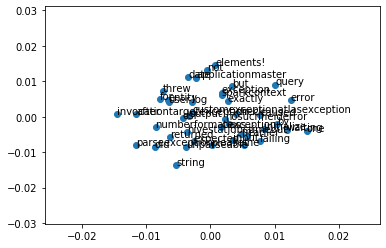

In [54]:
X = model[model.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)
# create a scatter plot of the projection
pyplot.scatter(result[:, 0], result[:, 1])
words = list(model.wv.vocab)
for i, word in enumerate(words):
	pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

In [55]:
model.wv.most_similar("applicationmaster")

[('customexceptionatlasexception', 0.1976708620786667),
 ('exactly', 0.18317873775959015),
 ('class', 0.18075916171073914),
 ('query', 0.1448657214641571),
 ('exception', 0.14406882226467133),
 ('not', 0.12240374088287354),
 ('elements!', 0.10902541875839233),
 ('nosuchfielderror', 0.1073375791311264),
 ('threw', 0.10316222161054611),
 ('after', 0.08218948543071747)]

In [56]:
model.save("error2vec.model")

In [57]:
model2 = Word2Vec.load("error2vec.model")

In [58]:
model2.train([['applicationmaster','user','class' ,'threw','exception','invocationtargetexception','caused','by','parseexception','unparseable','date']], total_examples=1, epochs=1)

(2, 11)

In [66]:
vector1 = model2.wv['applicationmaster'] 
vector1

array([-1.5216331e-03,  2.1264416e-03, -4.5812828e-03,  5.1245664e-04,
        2.3106628e-03,  1.2236505e-03, -2.9917592e-03,  4.5555271e-03,
        3.0769303e-03, -4.5278682e-03, -2.8354938e-03,  2.9480772e-03,
       -4.4230609e-03, -1.6548907e-03,  1.4107415e-03, -2.9823228e-04,
       -2.5221256e-03, -1.6566409e-03,  1.9956108e-03,  8.9801481e-04,
        3.4561101e-03, -1.8206621e-03, -6.8120647e-04,  1.0612139e-03,
       -1.0398305e-03,  3.4792945e-03, -4.7043073e-03, -2.9082524e-03,
       -1.8904898e-03,  4.4540974e-04, -4.3816464e-03, -3.1550124e-03,
        2.8851044e-03,  1.2521943e-03, -3.2937247e-03,  1.2428507e-03,
       -4.6446666e-04, -3.5546292e-03, -2.0028956e-03, -1.4064135e-03,
        1.5741176e-03, -4.8270756e-03,  2.7577940e-03,  1.9224212e-03,
        1.7045614e-03,  2.1800159e-03, -4.8275380e-03, -4.1458788e-03,
       -3.1670914e-03,  1.4802191e-03,  2.9364838e-03, -1.9975980e-03,
       -2.7283807e-03,  1.6376496e-03,  4.8910017e-04, -3.9685089e-03,
      

In [67]:
vector2 = model2.wv['applicationmaster']
vector2

array([-1.5216331e-03,  2.1264416e-03, -4.5812828e-03,  5.1245664e-04,
        2.3106628e-03,  1.2236505e-03, -2.9917592e-03,  4.5555271e-03,
        3.0769303e-03, -4.5278682e-03, -2.8354938e-03,  2.9480772e-03,
       -4.4230609e-03, -1.6548907e-03,  1.4107415e-03, -2.9823228e-04,
       -2.5221256e-03, -1.6566409e-03,  1.9956108e-03,  8.9801481e-04,
        3.4561101e-03, -1.8206621e-03, -6.8120647e-04,  1.0612139e-03,
       -1.0398305e-03,  3.4792945e-03, -4.7043073e-03, -2.9082524e-03,
       -1.8904898e-03,  4.4540974e-04, -4.3816464e-03, -3.1550124e-03,
        2.8851044e-03,  1.2521943e-03, -3.2937247e-03,  1.2428507e-03,
       -4.6446666e-04, -3.5546292e-03, -2.0028956e-03, -1.4064135e-03,
        1.5741176e-03, -4.8270756e-03,  2.7577940e-03,  1.9224212e-03,
        1.7045614e-03,  2.1800159e-03, -4.8275380e-03, -4.1458788e-03,
       -3.1670914e-03,  1.4802191e-03,  2.9364838e-03, -1.9975980e-03,
       -2.7283807e-03,  1.6376496e-03,  4.8910017e-04, -3.9685089e-03,
      

In [69]:
from sklearn.metrics.pairwise import cosine_similarity

In [71]:
cosine_similarity(vector1.reshape(-1, 1), vector2.reshape(-1, 1))

array([[ 1., -1.,  1., ...,  1., -1.,  1.],
       [-1.,  1., -1., ..., -1.,  1., -1.],
       [ 1., -1.,  1., ...,  1., -1.,  1.],
       ...,
       [ 1., -1.,  1., ...,  1., -1.,  1.],
       [-1.,  1., -1., ..., -1.,  1., -1.],
       [ 1., -1.,  1., ...,  1., -1.,  1.]], dtype=float32)

In [73]:
vector2-vector1

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)

In [68]:
model2.n_similarity(vector1,vector2)

C:\installed\anaconda\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `n_similarity` (Method will be removed in 4.0.0, use self.wv.n_similarity() instead).
  """Entry point for launching an IPython kernel.


TypeError: 'numpy.float32' object is not iterable

In [13]:
#model.similar_by_word("applicationmaster")
model.similarity('applicationmaster', 'applicationmaster')

C:\installed\anaconda\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  


1.0

In [211]:
model.wv.vocab

{'applicationmaster': <gensim.models.keyedvectors.Vocab at 0x2b3a573b7b8>,
 'user': <gensim.models.keyedvectors.Vocab at 0x2b3a573b320>,
 'class': <gensim.models.keyedvectors.Vocab at 0x2b3a573bfd0>,
 'threw': <gensim.models.keyedvectors.Vocab at 0x2b3a573bb00>,
 'exception': <gensim.models.keyedvectors.Vocab at 0x2b3a573bd30>,
 'invocationtargetexception': <gensim.models.keyedvectors.Vocab at 0x2b3a573f828>,
 'caused': <gensim.models.keyedvectors.Vocab at 0x2b3a573fd68>,
 'by': <gensim.models.keyedvectors.Vocab at 0x2b3a570d780>,
 'nosuchfielderror': <gensim.models.keyedvectors.Vocab at 0x2b3a570d9b0>,
 'hivestatjdbctimeout': <gensim.models.keyedvectors.Vocab at 0x2b3a570dbe0>,
 'for': <gensim.models.keyedvectors.Vocab at 0x2b3a570d080>}

In [52]:
X = model[model.wv.vocab]

C:\installed\anaconda\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


In [15]:
import spacy
import nltk
nltk.download("en_core_web_sm")

[nltk_data] Error loading en_core_web_sm: Package 'en_core_web_sm' not
[nltk_data]     found in index


False

In [74]:
from sklearn.feature_extraction.text import CountVectorizer

In [75]:
text = ["The quick brown fox jumped over the lazy dog."]

In [76]:
vectorizer = CountVectorizer()

In [77]:
vectorizer.fit(text)

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
                lowercase=True, max_df=1.0, max_features=None, min_df=1,
                ngram_range=(1, 1), preprocessor=None, stop_words=None,
                strip_accents=None, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, vocabulary=None)

In [78]:
print(vectorizer.vocabulary_)

{'the': 7, 'quick': 6, 'brown': 0, 'fox': 2, 'jumped': 3, 'over': 5, 'lazy': 4, 'dog': 1}


In [79]:
vector = vectorizer.transform(text)

In [82]:
print(vector.toarray())

[[1 1 1 1 1 1 1 2]]


In [81]:
print(vectorizer.vocabulary_)

{'the': 7, 'quick': 6, 'brown': 0, 'fox': 2, 'jumped': 3, 'over': 5, 'lazy': 4, 'dog': 1}


In [85]:
import os
processedFilePth = r"C:\Users\sreddy\OneDrive - MerckGroup\New folder\process_logs"
processedFileName = "2application_1568810042014_190734_processed.csv"
fullprocessedFileName=os.path.join(processedFilePth,processedFileName)

In [89]:
import pandas as pd
def read_logfile(fullLogFileName):
    header_list = ["level", "message","d1","d2"]
    log_df=pd.read_csv(fullLogFileName,delimiter="|",names=header_list)
    return log_df
DBFullPath=r'C:\Users\sreddy\OneDrive - MerckGroup\New folder\process_logs\rdb.csv'    
fullInLogFileName=fullprocessedFileName
logDf=read_logfile(fullInLogFileName)

In [110]:
for i in logDf[logDf["level"]=="error"]["message"]:
    print(i)

 applicationmaster: user class threw exception: java.lang.reflect.invocationtargetexception  java.lang.reflect.invocationtargetexception caused by: java.lang.numberformatexception: for input string: "" 
 applicationmaster: user class threw exception: java.lang.reflect.invocationtargetexception  java.lang.reflect.invocationtargetexception caused by: java.lang.numberformatexception: for input string: "" 


In [105]:
def read_kb(dbFullPath):    
    header_list = ["message", "solution"]
    kdbDF=pd.read_csv(dbFullPath,delimiter="|",names=header_list)
    return kdbDF

In [106]:
kbDf=read_kb(DBFullPath)

In [113]:
for i in kbDf["message"]:
    print(i)

applicationmaster user class threw exception invocationtargetexception caused by parseexception unparseable date
applicationmaster   user class threw exception nosuchfielderror hivestatjdbctimeout  nosuchfielderror hivestatjdbctimeout 
applicationmaster user class threw exception customexceptionatlasexception expected exactly one entity, but dsl query returned  elements!
applicationmaster user class threw exception invocationtargetexception caused by numberformatexception for input string
applicationmaster sparkcontext did not initialize after waiting for  m please check earlier log output for error failing the
importprocessstep sqoop import  abort!  customexceptionsqoopexception sqoop import  abort! 
atlasrepository body {errorcould not find traitdatacataloguemcv in the repository for entity dfbabdbafbed}
hiveconnection   error opening session  ttransportexception clientprotocolexception 
utils   unable to read hiveserver configs from zookeeper


In [184]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(binary=False,max_df=0.5,
                             ngram_range = (1,1),use_idf = True, norm = None, stop_words=['the','for','in','to','but'], 
                             smooth_idf=True)

In [185]:
kbVecDf = vectorizer.fit_transform(kbDf['message'])

In [186]:
kbVecDf

<9x61 sparse matrix of type '<class 'numpy.float64'>'
	with 79 stored elements in Compressed Sparse Row format>

In [187]:
vectorizer.vocabulary_

{'user': 57,
 'class': 7,
 'threw': 52,
 'exception': 22,
 'invocationtargetexception': 34,
 'caused': 5,
 'by': 4,
 'parseexception': 42,
 'unparseable': 56,
 'date': 12,
 'nosuchfielderror': 36,
 'hivestatjdbctimeout': 29,
 'customexceptionatlasexception': 10,
 'expected': 23,
 'exactly': 21,
 'one': 39,
 'entity': 18,
 'dsl': 15,
 'query': 44,
 'returned': 47,
 'elements': 17,
 'numberformatexception': 38,
 'input': 33,
 'string': 51,
 'sparkcontext': 49,
 'did': 14,
 'not': 37,
 'initialize': 32,
 'after': 1,
 'waiting': 59,
 'please': 43,
 'check': 6,
 'earlier': 16,
 'log': 35,
 'output': 41,
 'error': 19,
 'failing': 24,
 'importprocessstep': 31,
 'sqoop': 50,
 'import': 30,
 'abort': 0,
 'customexceptionsqoopexception': 11,
 'atlasrepository': 2,
 'body': 3,
 'errorcould': 20,
 'find': 25,
 'traitdatacataloguemcv': 53,
 'repository': 46,
 'dfbabdbafbed': 13,
 'hiveconnection': 27,
 'opening': 40,
 'session': 48,
 'ttransportexception': 54,
 'clientprotocolexception': 8,
 'utils